# 2018/2019 - Task List 1

1. Generate random variable from prefered dystribution using Pyro (pyro.sample)
    
    - animate how distribution of values changes
    - animate histograms of values
    - start with empty list of values, generate new samples, generate histogram
    
    
2. Write a simulator (and exact solution utilizing Bayes theorem) for chances to be ill on a certain disease. We know that it affects from about 1 to 100 out of 50,000 people. There was developed a test to check whether the person has the disease and it is quite accurate: the probability that the test result is positive (suggesting the person has the disease), given that the person does not have the disease, is only 2 percent; the probability that the test result is negative (suggesting the person does not have the disease), given that the person has the disease, is only 1 percent. When a random person gets tested for the disease and the result comes back positive, what is the probability that the person has the disease? Check whole parameter space and visualise results.

    - it must be a simulator!
    - sample from distribution using given probabilities
    - repeate experiment and compare with Bayes equation


## Required imports

In [1]:
%matplotlib inline
import pyro
import torch
import numpy as np
import matplotlib.pyplot as plt

from matplotlib import animation, rc
from IPython.display import HTML

## Generating single value from normal distribution with given mean and variance

In [2]:
mean = 0
variance = 10
x = pyro.sample("normal_sampling", pyro.distributions.Normal(mean, variance))
print(x)

tensor(-3.5175)


## Sampling from categorical probabilities with given probabilities

In [7]:
x = pyro.sample("categorical_sampling", pyro.distributions.Categorical(logits = torch.tensor([0.5, 0.5])))
print(x)

tensor(0)


## Animating data

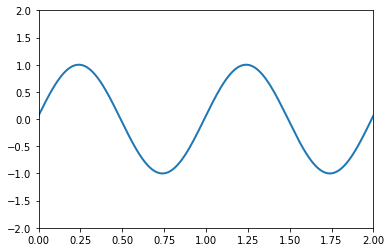

In [9]:
def animate():
    # First set up the figure, the axis, and the plot element we want to animate
    fig, ax = plt.subplots()

    ax.set_xlim(( 0, 2))
    ax.set_ylim((-2, 2))

    line, = ax.plot([], [], lw=2)
    
    # animation function. This is called sequentially
    def sin(i):
        x = np.linspace(0, 2, 1000)
        y = np.sin(2 * np.pi * (x - 0.01 * i))
        line.set_data(x, y)
        return (line,)

    # initialization function: plot the background of each frame
    def init():
        line.set_data([], [])
        return (line,)
    # call the animator. blit=True means only re-draw the parts that have changed.
    anim = animation.FuncAnimation(fig, sin, init_func=init,
                                   frames=100, interval=20, blit=True)
    return HTML(anim.to_jshtml())

animate()

## Drawing histogram

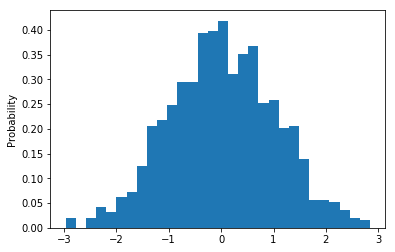

In [3]:
x = np.random.normal(size = 1000)
plt.hist(x, density=True, bins=30)
plt.ylabel('Probability');

## Task 1

Generate random variable from prefered dystribution using Pyro (pyro.sample)
- animate how distribution of values changes
- animate histograms of values
- start with empty list of values, generate new samples, generate histogram


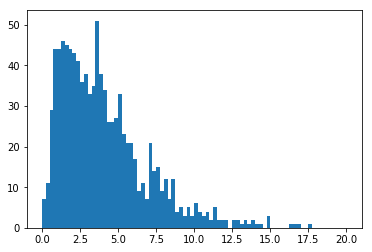

In [154]:
## Insert solution here
degrees_of_freedom = 4
number_of_iterations = 1000

def animate():
    value_l = [] 

    def iteration( _ ):
        plt.cla()
        value_l.append(pyro.sample( "chi2_sampling", pyro.distributions.Chi2(degrees_of_freedom)))
        plt.hist( value_l, 80 ,(0.0,20.0) )
    
    fig, ax = plt.subplots()
    
    
    anim = animation.FuncAnimation( fig, iteration, number_of_iterations, lambda : plt.cla() , interval=20 )
    return HTML(anim.to_jshtml())

animate()
    
        
    



## Task 2

Write a simulator (and exact solution utilizing Bayes theorem) for chances to be ill on a certain disease. We know that it affects from about 1 to 100 out of 50,000 people. There was developed a test to check whether the person has the disease and it is quite accurate: the probability that the test result is positive (suggesting the person has the disease), given that the person does not have the disease, is only 2 percent; the probability that the test result is negative (suggesting the person does not have the disease), given that the person has the disease, is only 1 percent. When a random person gets tested for the disease and the result comes back positive, what is the probability that the person has the disease? Check whole parameter space and visualise results.
- it must be a simulator!
- sample from distribution using given probabilities
- repeate experiment and compare with Bayes equation

P(A|B)=P(B|A)*P(A)/P(B)
P(Ill|Positive) = P(Positive|Ill)*P( Positive )

P(A) = SUM_i( P(A|X_i)*P(X_i) )
P(Positive) = P(Positive|Ill)*P(Positive) + P(Positive|Well)*P(Well)

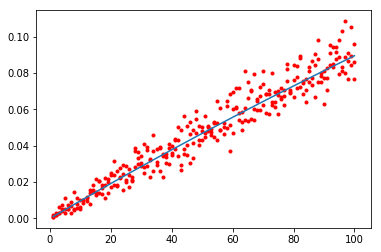

In [153]:
#PARAMETERS
POPULATION = 50_000
RANGE = (1,101)
OUT_OF = 50_000
REPEAT = 3

P_POSITIVE_WELL = 0.02
P_POSITIVE_ILL = 1 - P_POSITIVE_WELL
P_NEGATIVE_ILL = 0.01
P_NEGATIVE_WELL = 1 - P_NEGATIVE_ILL

def bayes_ill_positive( p_ill ):
    p_well = 1 - p_ill
    return P_POSITIVE_ILL * p_ill / ( P_POSITIVE_ILL * p_ill + P_POSITIVE_WELL * p_well )

def create_person( p_ill ):
    p_well = 1 - p_ill
    is_ill = pyro.sample( "categorical_sampling", pyro.distributions.Categorical( probs=torch.tensor([p_well, p_ill])))
    is_positive = None
    if is_ill :
        is_positive = pyro.sample( "categorical_sampling", pyro.distributions.Categorical( probs=torch.tensor([P_NEGATIVE_ILL, P_POSITIVE_ILL])))
    else:
        is_positive = pyro.sample( "categorical_sampling", pyro.distributions.Categorical( probs=torch.tensor([P_NEGATIVE_WELL, P_POSITIVE_WELL])))
    return [is_positive, is_ill]

def simulation_step( p_ill, population ):
    population = np.array([create_person( p_ill ) for _ in range( population )])
    positive_size = np.count_nonzero(population[:,0])
    positive_ill_size = np.count_nonzero( population[:,0]+population[:,1] == 2 )
    return positive_ill_size/positive_size

def simulation( population, range_ill, out_of, repeat ):
    results_bayes = []
    results_simulation = []
    for ill_people in range( range_ill[0], range_ill[1] ):
        p_ill = ill_people / out_of
        
        results_bayes.append([ill_people, bayes_ill_positive(p_ill)])
        for _ in range(repeat) :
            step_result = simulation_step(p_ill, population)
            results_simulation.append(( ill_people, step_result))
    return ( np.array(results_bayes), results_simulation )

def run( population, range_ill, out_of, repeat ):
    results_bayes, results_simulation = simulation( population, range_ill, out_of, repeat )
    plt.plot( results_bayes[:,0], results_bayes[:,1] )
    plt.scatter([x for (x,y) in results_simulation],\
        [y for (x,y) in results_simulation],\
        marker='.', color='red', label='Sim')
    plt.show()
    return

run( POPULATION, RANGE, OUT_OF, REPEAT )
